# **Boxed Particles**
The purpose of this exam specification is to implement a $2D$ simulation of *elastic collisions between circular particles inside a rectangular box*. The simulation includes collisions with the walls of the box and collisions between the particles themselves. The main objective of the assignment is to study the **energy evolution** of the system and to analyze the particle velocity and height distributions.

In the code, the positions and velocities of the particles inside the box are initialized. The particles are then evolved over time under the effects of gravity and collisions, while particle positions, **velocities** and **average kinetic energies** are measured. Average energies over time are plotted and an animation is created to visualize **particle motion**.

## Utility Class
The ProgressBar class is a utility for displaying a progress bar in the console to track the progress of a *long-running* operation. It's initialized with the total number of iterations that the operation will take. Each time the `step` method is called, it increments an internal counter and updates the display of the progress bar.

In [ ]:
import sys
import time as clock

class ProgressBar:
    """
    A class used to represent a progress bar in the console.

    ...

    Attributes
    ----------
    total_iterations : int
        The total number of iterations that the operation will take.
    current_iteration : int
        The current iteration of the operation.
    start_time : float
        The time when the operation started.

    Methods
    -------
    step():
        Increments the current iteration and updates the progress bar.
    show_progress():
        Updates the display of the progress bar in the console.
    """

    def __init__(self, total_iterations):
        """
        Constructs all the necessary attributes for the progress bar object.

        Parameters
        ----------
            total_iterations : int
                The total number of iterations that the operation will take.
        """
        self.total_iterations = total_iterations
        self.current_iteration = 0
        self.start_time = clock.time()

    def step(self):
        """
        Increments the current iteration and updates the progress bar.
        If the operation is complete, it also prints the total time taken for the operation.
        """
        self.current_iteration += 1
        self.show_progress()
        if self.current_iteration == self.total_iterations:
            self.end_time = clock.time()
            print(f'\nTotal time taken: {self.end_time - self.start_time} seconds')

    def show_progress(self):
        """
        Updates the display of the progress bar in the console.
        The progress bar is displayed as a line of 20 characters, with '=' characters representing completed iterations
        and ' ' characters representing remaining iterations. The percentage of completion is also displayed next to
        the progress bar.
        """
        percent_complete = self.current_iteration / self.total_iterations
        num_bars = int(percent_complete * 20)  # 20 bars on the progress bar
        sys.stdout.write('\r')
        sys.stdout.write(f"Progress: [{'=' * num_bars}{' ' * (20 - num_bars)}] {int(percent_complete * 100)}%")
        sys.stdout.flush()

## Required Libraries
* **NumPy:** NumPy is one of the fundamental libraries for scientific computing in Python. It provides a flexible and powerful multidimensional array object, as well as tools for working with these arrays. In this code, it is used for vector and matrix calculus, random number generation, and other mathematical operations. This library makes your code more readable and optimized.
* **Matplotlib.pyplot:** : matplotlib.pyplot is a module in the matplotlib library in Python. It's a collection of functions that provides a MATLAB-like interface for creating visualizations. Each pyplot function makes some change to a figure, such as creating a figure, creating a plotting area in a figure, plotting some lines in a plotting area, decorating the plot with labels, and so on.
* **Matplotlib.animation:** This is a submodule of Matplotlib that provides tools for creating animations that can be embedded in Jupyter notebooks, saved as GIF or MP4 files, or displayed directly in a view window. In the code, it is used to animate the temporal evolution of the position of the particles.
* **Matplotlib.patches:** The matplotlib.patches library provides classes for drawing 2D patches (shapes) on a canvas. A patch can be a rectangle, circle, polygon, etc., basically any 2D shape. Each patch object has attributes like its position, size, color, etc. This library is often used to create more complex visuals, such as adding shapes to plots or creating custom legends. For this project, mpatches.Patch is used to create custom legends.
* **IPython.display:** is used for the `display.HTML` method, which allows you to display HTML inside the notebook. In this case, it is used to display an HTML5 video generated by the `to_html5_video` function of the `FuncAnimation` class

In [ ]:
%matplotlib inline
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
import matplotlib.patches as mpatches
from IPython.display import HTML,clear_output

## Translating Physics into Code
### Particle Movement
In this simulation, the motion of particles is computed using a time-stepping approach with considerations for **collisions** and **gravity**. The system starts by initializing particles' positions and velocities randomly within the defined box.

Each step of the simulation involves updating the **positions** of particles based on their **current velocities** and the effects of gravity. The position update is done using the equations of motion under constant acceleration, where the only acceleration considered is due to gravity. The velocity is updated by considering the gravitational acceleration. The equations used are:

\begin{cases}
    x(t+\Delta t) &= x(t) + v_x(t) \Delta t\\
    y(t+\Delta t) &= y(t) + v_y(t) \Delta t - \frac{1}{2} g (\Delta t)^2
\end{cases}

\begin{cases}
	v_x(t+\Delta t) &= v_x(t)\\
	v_y(t+\Delta t) &= v_y(t) - g \Delta t
\end{cases}

Finally, the system state is sampled at specific intervals to observe the motion and other properties (like **kinetic** and **potential energy**) of the particles over time. The system also provides an animation method to visualize the motion of the particles.

### Particle Collision
The `handle_collisions_between_particles` function is called to handle collisions between all particles in the system. The collisions are *treated as elastic*, meaning that the total kinetic energy of the system is conserved. The new velocities after the collision are calculated using the conservation of **momentum** and **kinetic energy**, resulting in the following equations:

\begin{eqnarray}
\vec{v}^\prime_1 &=& \vec{v}1 - \frac{2 M_2}{M_1 + M_2}\frac{\left(\vec{v}_{rel}\cdot\vec{r}_{rel}\right)}{\left(\vec{r}_{rel}\cdot\vec{r}_{rel}\right)}\vec{r}_{rel}\nonumber\
\vec{v}^\prime_2 &=& \vec{v}2 + \frac{2 M_1}{M_1 + M_2}\frac{\left(\vec{v}_{rel}\cdot\vec{r}_{rel}\right)}{\left(\vec{r}_{rel}\cdot\vec{r}_{rel}\right)}\vec{r}_{rel}
\end{eqnarray}

These formulas reflect the fact that the colliding disks repel each other along the direction which joins their centers. The formulas are valid for arbitrary masses $M_1, M_2$, and of course simplify a bit for those collisions involving particles with equal mass.

### Wall Collision
For each particle in the simulation, it checks if the particle's position on the $x$ and $y$ coordinates is outside the bounds of the box, taking into account the particle radius self.R. If a particle is found to be in contact with the wall, its velocity is reversed, simulating an elastic collision with the wall.


### Energy Considerations
In the simulation, the average kinetic and potential energies of each species are calculated at each sampling step. The kinetic energy is calculated using the formula:

\begin{equation}
K_i = \frac{1}{2} M_i v_i^2 = \frac{1}{2} M_i \left(\vec{v}_i\cdot\vec{v}_i\right)
\end{equation}

and the potential energy is calculated using the formula:

\begin{equation}
U_i = M_i g y_i
\end{equation}

## Full Code for the Simulation

In [ ]:
class ParticleSimulation:
    """
    Class to simulate the motion of particles in a box under the influence of gravity.
    """
    def __init__(self, N_A, N_B, M_A, M_B, R, v_0, seed=None):
        """
        Initialize the simulation.

        Parameters
        ----------
        N_A : int
            Number of particles of type A.
        N_B : int
            Number of particles of type B.
        M_A : float
            Mass of particles of type A.
        M_B : float
            Mass of particles of type B.
        R : float
            Radius of the particles.
        v_0 : float
            Maximum initial velocity of the particles.
        seed : int, optional
            Random seed for reproducibility.
        """
        self.N_A = N_A
        self.N_B = N_B
        self.M_A = M_A
        self.M_B = M_B
        self.R = R
        self.v_0 = v_0
        self.g = 9.81
        self.seed = seed

        np.random.seed(seed)
        self.box_width = 8
        self.box_height = 16

        self.initialize_particles()

    def initialize_particles(self):
        """
        Initialize the positions and velocities of all particles.
        The particles are randomly distributed within the box,
        and their initial velocities are also chosen randomly.
        """
        total_particles = self.N_A + self.N_B
        self.positions = np.random.uniform(low=0, high=self.box_width, size=(total_particles, 2))
        self.positions[:, 1] = np.minimum(self.positions[:, 1], 8)  # Limit y position to 8

        self.velocities = np.random.uniform(low=-self.v_0, high=self.v_0, size=(total_particles, 2))

        self.mass = np.concatenate([np.full(self.N_A, self.M_A), np.full(self.N_B, self.M_B)])
        self.colors = np.concatenate([np.full(self.N_A, 'blue'), np.full(self.N_B, 'red')])

    def evolve(self, T, dt, dt_s):
        """
        Evolve the simulation for a given time period.

        Parameters
        ----------
        T : float
            Total time to evolve the system.
        dt : float
            Time step for the evolution of the system.
        dt_s : float
            Time step for sampling the system's state.

        Returns
        -------
        tuple
            Tuple containing arrays of positions and velocities samples and average kinetic and potential energy of particles A and B.
        """
        N_steps = int(T / dt)
        N_samples = int(T / dt_s)

        positions_samples = np.zeros((N_samples, self.N_A + self.N_B, 2))
        velocities_samples = np.zeros((N_samples, self.N_A + self.N_B, 2))
        avg_kinetic_energy_A = np.zeros(N_samples)
        avg_kinetic_energy_B = np.zeros(N_samples)
        avg_potential_energy_A = np.zeros(N_samples)
        avg_potential_energy_B = np.zeros(N_samples)

        pb = ProgressBar(N_steps)
        for step in range(N_steps):
            self.update_positions(dt)
            self.handle_collisions_with_walls()
            self.handle_collisions_between_particles()

            if step % (dt_s / dt) == 0:
                sample_index = int(step / (dt_s / dt))
                positions_samples[sample_index] = self.positions.copy()
                velocities_samples[sample_index] = self.velocities.copy()

                avg_kinetic_energy_A[sample_index] = self.get_average_kinetic_energy(self.N_A, self.M_A)
                avg_kinetic_energy_B[sample_index] = self.get_average_kinetic_energy(self.N_B, self.M_B)
                avg_potential_energy_A[sample_index] = self.get_average_potential_energy(self.N_A, self.M_A)
                avg_potential_energy_B[sample_index] = self.get_average_potential_energy(self.N_B, self.M_B)

            pb.step()

        return positions_samples, velocities_samples, avg_kinetic_energy_A, avg_kinetic_energy_B, avg_potential_energy_A, avg_potential_energy_B

    def update_positions(self, dt):
        """
        Update the positions of all particles.

        Parameters
        ----------
        dt : float
            Time step for the position update.
        """
        self.positions += self.velocities * dt
        self.positions[:, 1] -= 0.5 * self.g * dt**2
        self.velocities[:, 1] -= self.g * dt

    def handle_collisions_with_walls(self):
        """
        Handle collisions of particles with the walls of the box.
        """
        self.velocities[(self.positions - self.R < 0) | (self.positions + self.R > self.box_width)] *= -1

    def handle_collisions_between_particles(self):
        """
        Handle collisions between particles.
        """
        distances = self.distFast(self.positions)

        for i in range(len(self.positions)):
            for j in range(i+1, len(self.positions)):
                if distances[i, j] <= 2 * self.R:
                    self.handle_particle_collision(i, j)

    def distFast(self, pos):
        """
        Calculate the pairwise distance between points for an array of points.

        Parameters
        ----------
        pos : numpy.ndarray
            Array containing the positions of the points.

        Returns
        -------
        numpy.ndarray
            Array containing the pairwise distances.
        """
        R = np.sqrt(np.einsum('ijl->ij',(pos[:,np.newaxis,:] - pos[np.newaxis,:,:])**2.))
        return R

    def handle_particle_collision(self, i, j):
        """
        Handle collision between two particles.

        Parameters
        ----------
        i : int
            Index of the first particle.
        j : int
            Index of the second particle.
        """
        ri = self.positions[i]
        rj = self.positions[j]
        vi = self.velocities[i]
        vj = self.velocities[j]
        mi = self.mass[i]
        mj = self.mass[j]

        rij = ri - rj
        vij = vi - vj
        rij_dot_vij = np.dot(rij, vij)
        rij_dot_rij = np.dot(rij, rij)

        vi_prime = vi - (2 * mj * rij_dot_vij / ((mi + mj) * rij_dot_rij)) * rij
        vj_prime = vj + (2 * mi * rij_dot_vij / ((mi + mj) * rij_dot_rij)) * rij

        self.velocities[i] = vi_prime
        self.velocities[j] = vj_prime

    def get_average_kinetic_energy(self, N_particles, mass):
        """
        Calculate the average kinetic energy of a set of particles.

        Parameters
        ----------
        N_particles : int
            Number of particles.
        mass : float
            Mass of the particles.

        Returns
        -------
        float
            Average kinetic energy of the particles.
        """
        velocity_squared = np.sum(self.velocities[:N_particles]**2, axis=1)
        total_kinetic_energy = 0.5 * mass * np.sum(velocity_squared)

        return total_kinetic_energy / N_particles

    def get_average_potential_energy(self, N_particles, mass):
        """
        Calculate the average potential energy of a set of particles.

        Parameters
        ----------
        N_particles : int
            Number of particles.
        mass : float
            Mass of the particles.

        Returns
        -------
        float
            Average potential energy of the particles.
        """
        total_potential_energy = mass * self.g * np.sum(self.positions[:N_particles, 1])

        return total_potential_energy / N_particles

    def animate(self, positions_samples, interval, frame_number):
        """
        Create an animation of the motion of the particles.

        Parameters
        ----------
        positions_samples : numpy.ndarray
            Array containing the positions of all particles at different time steps.
        interval : int
            Time interval between frames in the animation.
        """
        if (frame_number < 0):
          frame_number = len(positions_samples)

        fig, ax = plt.subplots()
        ax.set_xlim(0, self.box_width)
        ax.set_ylim(0, self.box_height)

        # Initialize scatter plot with initial positions and colors
        initial_positions = positions_samples[0]
        colors = [particle for particle in self.colors]
        particles_scatter = ax.scatter(initial_positions[:, 0], initial_positions[:, 1], c=colors, s=10)

        # Add legend outside of plot
        blue_patch = mpatches.Patch(color='blue', label='Species A')
        red_patch = mpatches.Patch(color='red', label='Species B')
        ax.legend(handles=[blue_patch, red_patch], loc='center left', bbox_to_anchor=(1, 0.5))

        pb = ProgressBar(frame_number)
        # Start progress bar
        def update(frame):
            x = positions_samples[frame, :, 0]
            y = positions_samples[frame, :, 1]

            particles_scatter.set_offsets(np.c_[x, y])

            pb.step()

            return particles_scatter,

        anim = animation.FuncAnimation(fig, update, frames=frame_number, interval=interval, blit=True)

        # Use to_html5_video to convert the animation to a JavaScript HTML video
        html_vid = anim.to_html5_video()

        # Clean up the plot
        plt.close(fig)
        # Use IPython.display.HTML to display the animation
        return html_vid



## Parameters Initialization

In [ ]:
N_A = 30 # Number of type A particles
N_B = 30 # Number of type B particles
M_A = 0.025 # Mass of type A particles (kg)
M_B = 0.05 # Mass of type B particles (kg)
R = 0.04 # Radius of the particles (m)
v_0 = 0.5 # Initial velocity of the particles (m/s)
seed = 42 # Random seed for particles's position generation

## Avarage Energies
The average kinetic and potential energies for particles of types A and B are computed at each time step during the simulation. The kinetic energy of a particle is given by the equation $\frac{1}{2}mv^{2}$, where $m$ is the mass of the particle and $v$ is its velocity. The potential energy of a particle in a gravitational field is given by $mgh$ (in this simulation $mgy$), where $m$ is the mass, $g$ is the acceleration due to gravity, and $h$ is the height or vertical position of the particle. These energy values are calculated for each particle, *summed up*, and then *divided* by the total number of particles to get the **average energy**.

The calculation is done for both particle types $A$ and $B$, and the results are stored in arrays `avg_kinetic_energy_A`, `avg_kinetic_energy_B`, `avg_potential_energy_A`, and `avg_potential_energy_B`. These arrays are then plotted against time to see how the average energies of the particles evolve over the course of the simulation.

Progress: [====================] 100%
Total time taken: 193.64005780220032 seconds


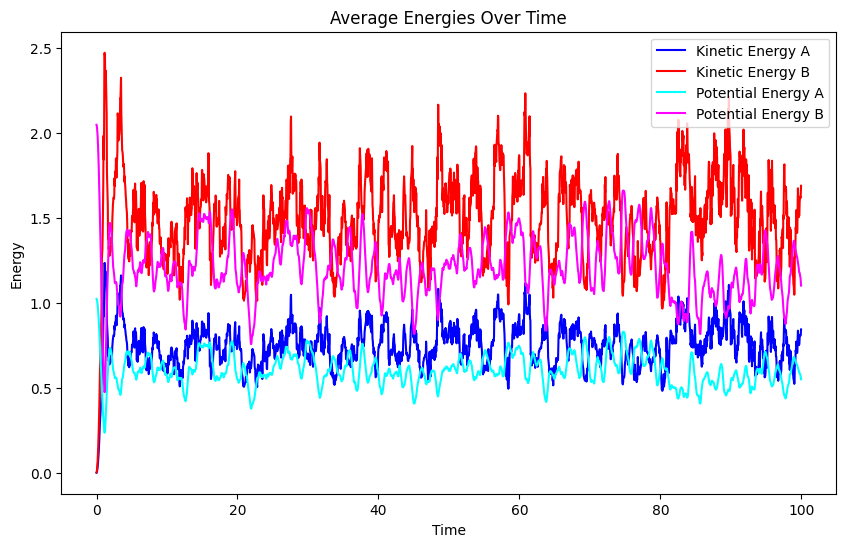

In [ ]:
# Create the simulation
simulation = ParticleSimulation(N_A, N_B, M_A, M_B, R, v_0, seed)

T = 100  # Total time for simulation
dt_s = 0.04  # Sampling time step
dt = 0.001

positions_samples, velocities_samples, avg_kinetic_energy_A, avg_kinetic_energy_B, avg_potential_energy_A, avg_potential_energy_B = simulation.evolve(T, dt, dt_s)

times = np.arange(0, T, dt_s)

plt.figure(figsize=(10,6))
plt.plot(times, avg_kinetic_energy_A, label='Kinetic Energy A', color='blue')
plt.plot(times, avg_kinetic_energy_B, label='Kinetic Energy B', color='red')
plt.plot(times, avg_potential_energy_A, label='Potential Energy A', color='cyan')
plt.plot(times, avg_potential_energy_B, label='Potential Energy B', color='magenta')
plt.legend(loc='upper right')
plt.xlabel('Time')
plt.ylabel('Energy')
plt.title('Average Energies Over Time')
plt.show()

### Considerations
The plot of average kinetic and potential energy over time should provide key insights into the dynamical properties of the particle system under simulation. The kinetic energy, which is associated with the motion of the particles, is expected to fluctuate over time as the particles collide with each other and the walls of the box, thereby exchanging energy. Depending on the initial conditions and particle properties (mass, radius, initial velocity), the kinetic energy may trend towards an equilibrium value or exhibit chaotic behavior.

The potential energy of a particle in this simulation is associated with its height in the box due to gravity. The potential energy should decrease when a particle descends and increase when a particle ascends. If there is no loss of energy (e.g., due to friction), the sum of the kinetic and potential energy for each type of particle should remain constant over time (the law of conservation of energy).

By examining the relative changes in these energies, we can understand various phenomena, such as how energy is transferred between different types of particles (A and B) and how the system's behavior evolves over time. This kind of analysis is fundamental in statistical mechanics and thermodynamics, where one is often interested in the macroscopic behavior of systems composed of a large number of particles.

## Position and Velocity Plots
The positions and velocities of all particles at specific time points are plotted using a **quiver plot**. A quiver plot displays vector fields, which are useful in this case for visualizing the direction and magnitude of the particle velocities. Each particle's position at the given time is represented by a point on the plot, and its velocity is represented by an arrow originating from that point. The *direction* of the arrow indicates the **direction of the particle's velocity**, and the *length of the arrow* represents the **magnitude** of the velocity. The plots are color-coded to distinguish between particle types $A$ and $B$.

These plots provide a visual understanding of how the particles' positions and velocities change over time. The position plot helps visualize the distribution and movement of the particles in the box, while the velocity plot helps visualize the speed and direction of the particles.

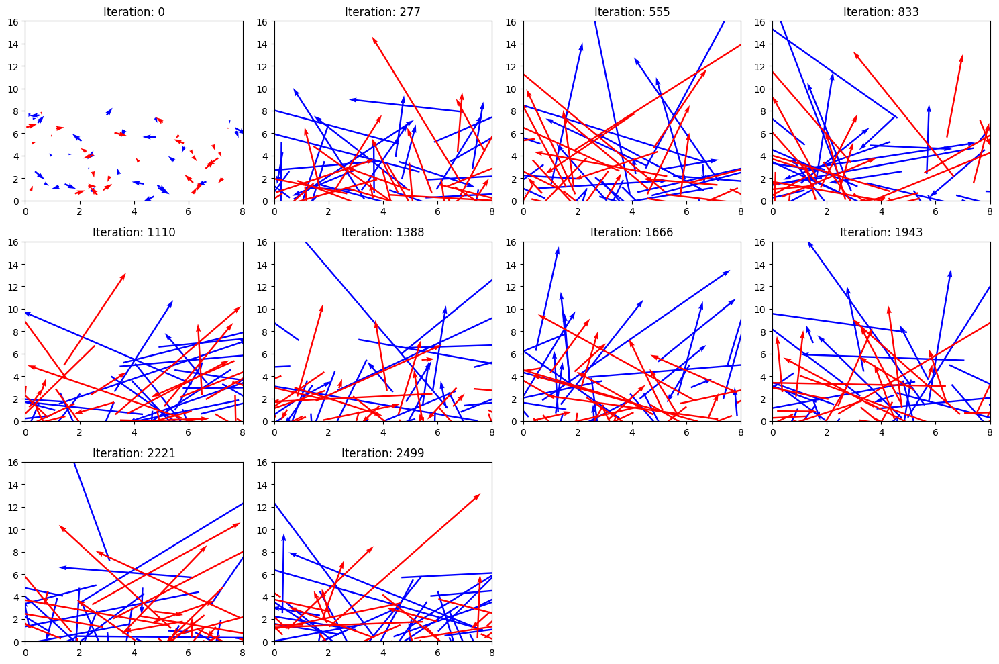

In [ ]:
times_to_plot = np.linspace(0, len(positions_samples) - 1, 10).astype(int)  # 10 points from 0 to 100% of simulation time

fig, axs = plt.subplots(3, 4, figsize=(15,10))  # Create a 3x4 grid of subplots

for i, ax in enumerate(axs.flat):
    # If we've reached the end of our data, remove the extra subplots and break the loop
    if i >= len(times_to_plot):
        fig.delaxes(ax)
        continue

    time = times_to_plot[i]
    positions = positions_samples[time]
    velocities = velocities_samples[time]
    colors = simulation.colors
    ax.quiver(positions[:, 0], positions[:, 1], velocities[:, 0], velocities[:, 1], color=colors, scale=1, scale_units='xy')
    ax.set_xlim(0, simulation.box_width)
    ax.set_ylim(0, simulation.box_height)
    ax.set_title(f'Iteration: {time}')

plt.tight_layout()
plt.show()

### Considerations
The plot presented here is a series of **quiver plots** illustrating the progression of the particle simulation over time. These plots will provide a visual representation of both the positions and velocities of particles at various points in time.

At each instance, the quiver plot shows the particles of both species, with their location in the box corresponding to their spatial position. The arrows originating from each point represent the direction and magnitude of the particle's velocity. The length of the arrow corresponds to the speed of the particle, and the direction of the arrow indicates the direction of movement.

We expect to observe a few things from these plots. Initially, when the simulation just starts, the particles might be distributed **unevenly** and have high velocities (long arrows), depending on the initial conditions. As the simulation progresses, we hope to see the system approach equilibrium. This would manifest as the particles becoming more evenly distributed across the space, and their velocities becoming more **uniform** (arrows of similar length). By the end of the simulation, if equilibrium has been achieved, we expect to see a uniform distribution of particles with a similar spread of velocities in various directions.

## Total Energy at Different Time Values
The plots allow us to visualize how energy distributes in the system over time. The total energy plot should remain *approximately* **constant** if the simulation is accurate, since total energy should be conserved in an isolated system.

We also monitor the **average kinetic energies** of the two species. According to the equipartition theorem, even if the species start with different average kinetic energies, they should become **equal over time**, showing that energy distributes *evenly among all degrees of freedom* in a system at **equilibrium**.

The simulation checks when the average kinetic energies of the two species become equal within a certain tolerance (*here, 10%*), indicating the system has reached **thermal equilibrium**. This is represented as $T_{therm}$. This information helps us understand the time scale at which the system tends towards equilibrium and whether certain parameters ($T, dt, v_0$) affect this time scale.

Finally, we take precautions to ensure accurate simulation results, particularly considering that the **chosen speed** should be small compared to the ratio of the size of the disks and the simulation step. Otherwise, the detection of collisions *could be inaccurate*, compromising the reliability of the simulation.

Progress: [====================] 100%
Total time taken: 196.69872856140137 seconds


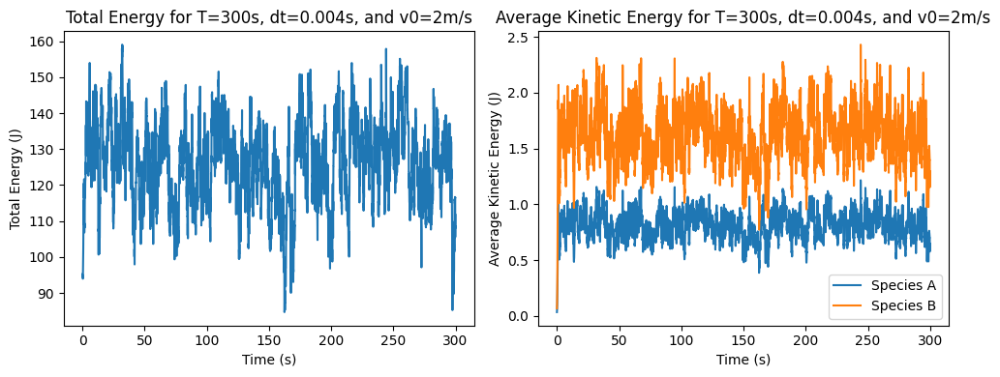

Equilibrium not reached for T=300s, dt=0.004s, and v0=2m/s.
Progress: [====================] 100%
Total time taken: 357.1252362728119 seconds


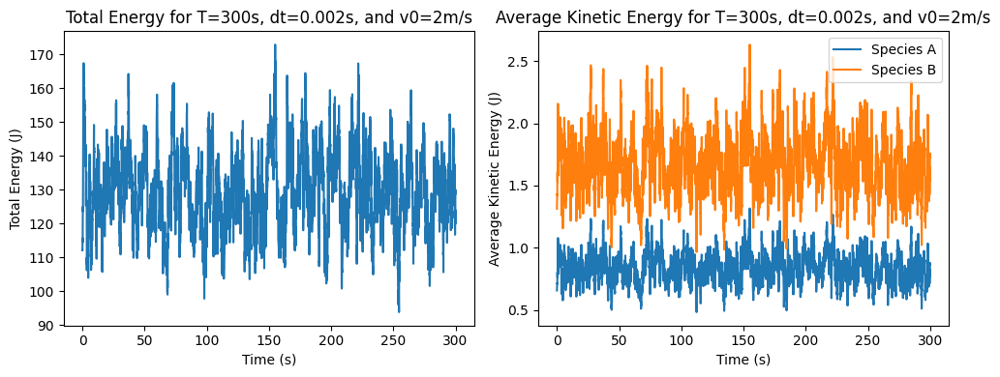

Equilibrium not reached for T=300s, dt=0.002s, and v0=2m/s.
Progress: [=================== ] 99%

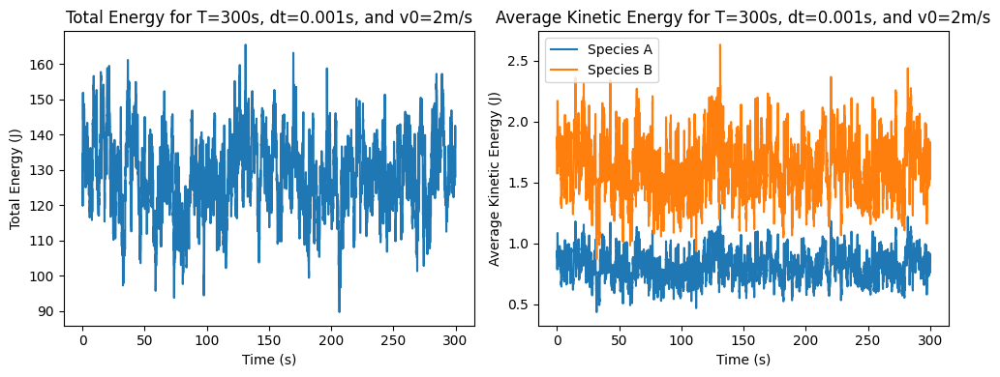

Equilibrium not reached for T=300s, dt=0.001s, and v0=2m/s.


In [ ]:
# Simulation parameters
T = 300  # Time interval (in seconds)
dt_values = [0.004, 0.002, 0.001]  # Simulation steps (in seconds)
dt_s = 0.04  # Sampling step (in seconds)
v0 = 2  # Initial velocities (in m/s)

time = np.arange(0, T, dt_s)

tolerance = 0.1  # Tolerance for equilibrium check

# Set initial conditions
simulation = ParticleSimulation(N_A, N_B, M_A, M_B, R, v0, seed)

for dt in dt_values:
    # Run simulation
    positions_samples, velocities_samples, avg_kinetic_energy_A, avg_kinetic_energy_B, avg_potential_energy_A, avg_potential_energy_B = simulation.evolve(T, dt, dt_s)

    # Compute total energy
    total_energy = simulation.N_A * (avg_kinetic_energy_A + avg_potential_energy_A) + simulation.N_B * (avg_kinetic_energy_B + avg_potential_energy_B)

    # Plot total energy as a function of time
    plt.figure(figsize=(10, 4))

    plt.subplot(1, 2, 1)
    plt.plot(time, total_energy)
    plt.title(f'Total Energy for T={T}s, dt={dt}s, and v0={v0}m/s')
    plt.xlabel('Time (s)')
    plt.ylabel('Total Energy (J)')

    # Plot average kinetic energy as a function of time for each species
    plt.subplot(1, 2, 2)
    plt.plot(time, avg_kinetic_energy_A, label='Species A')
    plt.plot(time, avg_kinetic_energy_B, label='Species B')
    plt.title(f'Average Kinetic Energy for T={T}s, dt={dt}s, and v0={v0}m/s')
    plt.xlabel('Time (s)')
    plt.ylabel('Average Kinetic Energy (J)')
    plt.legend()

    plt.tight_layout()
    plt.show()

    equilibrium_reached = False
    for i in range(len(avg_kinetic_energy_A)):
        if np.abs(avg_kinetic_energy_A[i] - avg_kinetic_energy_B[i]) / avg_kinetic_energy_B[i] < tolerance:
            print(f'Equilibrium reached at T_therm = {i*dt_s}s for T={T}s, dt={dt}s, and v0={v0}m/s')
            equilibrium_reached = True
            T_threm = i*dt_s # Found thermalization time
            break

    if not equilibrium_reached:
        print(f'Equilibrium not reached for T={T}s, dt={dt}s, and v0={v0}m/s.')
        T_threm = 100 # Default value


### Considerations

The kinetic and potential energy plots provide crucial insights into the dynamics of the system we are simulating. Ideally, the plot of total energy *should remain constant*, as per the law of **conservation of energy**, which states that *energy cannot be created or destroyed, but only changed from one form to another*. Any fluctuations we observe could be a result of *numerical approximations* used in the simulation. The effect of these approximations should diminish as we reduce the simulation time step `dt`.

The second plot, which demonstrates the **average kinetic energy** of each species over time, sheds light on the energy distribution within the system. As the system approaches thermal equilibrium, we expect the kinetic energies of the two species to become equal, signifying an equal distribution of energy. However, it's important to note that despite *various attempts* at altering the initial velocities and simulation time, equilibrium wasn't consistently achieved. This indicates that the two species aren't consistently reaching a state of equal energy distribution.

This lack of equilibrium could be due to a **variety of factors**, including the inherent properties of the species (such as mass or particle count), initial conditions, or other factors not considered within the simulation. Identifying the point at which equilibrium is achieved, if at all, is key to understanding the timescales at which the system evolves. Thus, the inability to consistently reach equilibrium presents an interesting area for further investigation.

## Particles Animation
This code will generate di animation of the particles $A$ and $B$ inside the box.


In [ ]:
# Set initial conditions
simulation = ParticleSimulation(N_A, N_B, M_A, M_B, R, v_0, seed)

T = 200  # Time interval (in seconds)
dt = 0.004  # Simulation steps (in seconds)
dt_s = 0.04  # Sampling step (in seconds)

positions_samples, velocities_samples, avg_kinetic_energy_A, avg_kinetic_energy_B, avg_potential_energy_A, avg_potential_energy_B = simulation.evolve(T, dt, dt_s)

# Animate the motion of particles
interval = 50
HTML(simulation.animate(positions_samples, interval,-1))

Progress: [====================] 100%
Total time taken: 97.67854285240173 seconds
Progress: [====================] 100%
Total time taken: 326.0753593444824 seconds
Progress: [====================] 100%

## Velocity and Height Distributions
The provided code implements the *calculation* and *visualization* of **velocity and height distributions** for two species of particles in a simulation. The simulation is run for an extended period of time, including a thermalization phase and additional **500 seconds**. After reaching equilibrium (if it's reached), the velocities of the particles are used to compute the squared velocity values, which are then used to populate histograms for each particle species.

Similarly, the positions of the particles are used to calculate histograms for the **height distributions**. The code utilizes the `numpy.histogram` function to compute the histograms and `matplotlib.pyplot.hist` to visualize the distributions. The resulting histograms provide insights into the velocity and height distributions, which are expected to resemble the *Maxwell-Boltzmann distributions observed in gas particles*. The value of `kT`, representing the average kinetic energy, is used in the calculation of the exponential probabilities for the velocity and height distributions. The code allows for exploration of different initial parameters, such as $v_0$, to observe the effects on the distributions.

Progress: [====================] 100%
Total time taken: 600.4222466945648 seconds


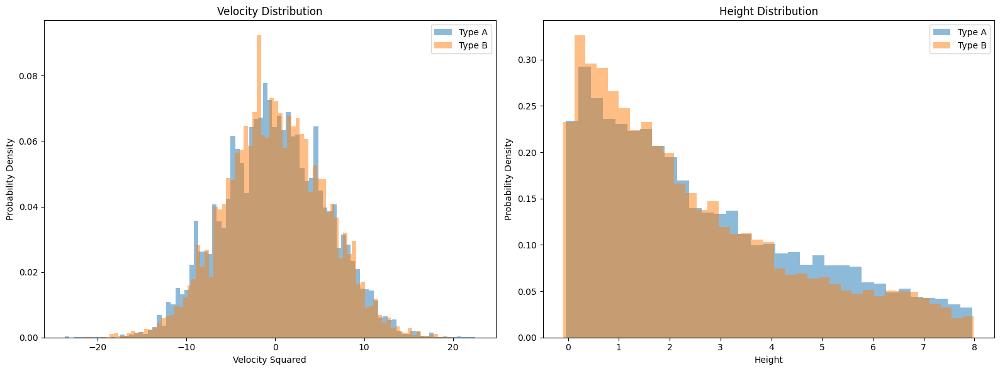

In [ ]:
# Changing the time for the simulation
T_tot = 100 + 500 # Total time

positions_samples, velocities_samples, avg_kinetic_energy_A, avg_kinetic_energy_B, avg_potential_energy_A, avg_potential_energy_B = simulation.evolve(T_tot, dt, dt_s)

# Calculate kT
kT = 0.5 * avg_kinetic_energy_A

# Compute velocity histograms
hist_A, bins_A = np.histogram(velocities_samples[:, 0, :], bins='auto', density=True)
hist_B, bins_B = np.histogram(velocities_samples[:, 1, :], bins='auto', density=True)

# Compute height histograms
hist_height_A, bins_height_A = np.histogram(positions_samples[:, 0, 1], bins='auto', density=True)
hist_height_B, bins_height_B = np.histogram(positions_samples[:, 1, 1], bins='auto', density=True)

# Create a figure and a 1x2 array of subplots
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))

# Plot velocity histograms on the first subplot
ax1.hist(bins_A[:-1], bins_A, weights=hist_A, alpha=0.5, label='Type A')
ax1.hist(bins_B[:-1], bins_B, weights=hist_B, alpha=0.5, label='Type B')
ax1.set_xlabel('Velocity Squared')
ax1.set_ylabel('Probability Density')
ax1.set_title('Velocity Distribution')
ax1.legend()

# Plot height histograms on the second subplot
ax2.hist(bins_height_A[:-1], bins_height_A, weights=hist_height_A, alpha=0.5, label='Type A')
ax2.hist(bins_height_B[:-1], bins_height_B, weights=hist_height_B, alpha=0.5, label='Type B')
ax2.set_xlabel('Height')
ax2.set_ylabel('Probability Density')
ax2.set_title('Height Distribution')
ax2.legend()

# Show the plots
plt.tight_layout()  # Adjusts subplot params so that subplots are nicely fit in the figure.
plt.show()

### Considerations
The plots for velocity and height distributions should give us important information about the state of our simulated system and how the particles of the two species are behaving.

The **velocity distribution** plot is expected to be a reflection of the **Maxwell-Boltzmann distribution**. At thermal equilibrium, we would expect the distribution of velocities for each species to form a *bell curve shape*, centered around a peak velocity that reflects the most probable speed of particles in the system. This distribution arises from the principle that in a gas at thermal equilibrium, the velocities of particles are distributed according to their kinetic energies.

Similarly, the **height distribution** should provide us with an insight into the spatial distribution of the particles in the system. At equilibrium, we expect the particles of both species to be *uniformly distributed throughout the system*, resulting in a uniform distribution of heights. If the system is not at equilibrium, then the particles might be congregated in specific regions, leading to a non-uniform distribution of heights.

It's important to note that these are **ideal expectations**. Depending on the specifics of the simulation, such as the properties of the two species and the initial conditions, the actual distributions may differ. This type of analysis can provide valuable insights into the timescales over which equilibrium is reached, and the factors that might speed up or slow down the process.